In [55]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats
from fit_pesato_3 import fit
from scipy.optimize import fsolve

In [17]:
file_name = r"sht75_nblab03_Hum_Temp_RUN_20221221080550_1_h.txt"
data_all = pd.read_csv(file_name, sep=" ", header=0)


In [18]:
len(data_all)

28251

In [19]:
d = data_all.drop(index = 0)
data = d.reset_index()

In [20]:
data["temp_corr"][0]

21.84

In [21]:
len(data)

28250

In [22]:
data.tail()

,index,n,anno,mese,giorno,hum_int,hum_corrected,RH_raw,RH_true,temp_int,temp_corr
28245,28246,28246,2022,12,21,39948.4,10798.750463,1509,49.28,6134,21.74
28246,28247,28247,2022,12,21,39949.4,10799.151087,1508,49.24,6135,21.75
28247,28248,28248,2022,12,21,39949.4,10799.551760,1508,49.24,6134,21.74
28248,28249,28249,2022,12,21,39950.4,10799.952324,1508,49.24,6134,21.74
28249,28250,28250,2022,12,21,39950.4,10800.352982,1509,49.27,6134,21.74


Fin qua ho solo tolto la prima riga, importato i pacchetti e i dati. Niente di importante. L'equazione della retta alla quale si fa riferimento nella prossima sezione è $y = mx+q$


In [23]:
def media(a):
    l =len(a)
    sum = 0
    for i in a:
        if np.isnan(i)== False :
            sum+= i
    return sum/l 
def gaussiana(lista,step = 0.001):
    media_u= np.mean(lista)
    sigma_u =np.std(lista)
    x = np.arange(media_u-sigma_u*4, media_u+sigma_u*4, step)
    y = [stats.norm.pdf(i,media_u, sigma_u) for i in x] 
    return [x, y]


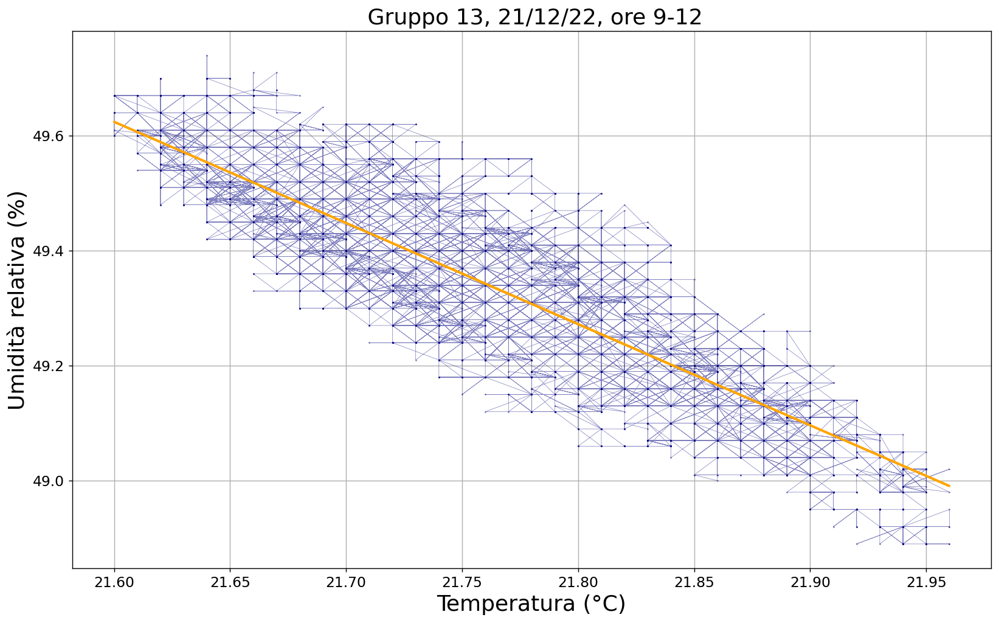

In [24]:
plt.figure(figsize =(15,9),dpi = 130)
plt.plot(data["temp_corr"] , data["RH_true"] , "-o",  alpha = 0.5, color = "navy", markersize  =0.5, linewidth = 0.4)
plt.xlabel("Temperatura (°C)", fontsize = 20)
plt.ylabel("Umidità relativa (%)", fontsize = 20)
#plt.ylim(58.4,58.9)
plt.title(" Gruppo 13, 21/12/22, ore 9-12", fontsize = 20)
e = [0.01 for i in range (len(data["temp_corr"]))]
result = fit(data["temp_corr"], data["RH_true"], e)
plt.xticks(fontsize = 13)
plt.yticks(fontsize = 13)
m, q = result[1], result[0]
retta = [ m*i +q for i in data["temp_corr"] ]
plt.grid(True)
plt.plot(data["temp_corr"] , retta, color = "orange", linewidth= 2)
residuals = []
for i in range(len(data["temp_corr"])):
    r = (data["RH_true"][i]-(m*data["temp_corr"][i]+q))/data["RH_true"][i]
    residuals.append(r)

In [41]:
print(m,q)

-1.760047972383496 87.64138047193933


In [25]:
res_st = np.std(residuals)

In [31]:
time = [i*0.4 for i in range(len(data["temp_corr"]))]

0.0004247787610619459


-0.004149393544995878

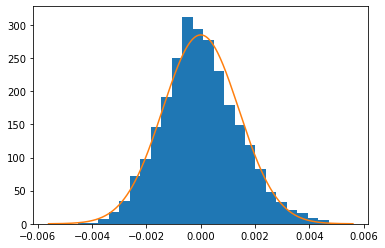

In [32]:
hh = plt.hist(residuals,bins= 25, density = True)
distribution = gaussiana (residuals,0.00001)
plt.plot(distribution[0],distribution[1])
integral = 0
for i in range(1):
    integral += (hh[0][-i]*(hh[1][-i-1]-hh[1][-i-2])+hh[0][i]*(hh[1][i+1]-hh[1][i]))
print(integral)
hh[1][1]
#print(hh)

In [33]:
hh[1][0]

-0.004534539757216097

In [34]:
hh[1][0]/np.std(residuals)

-3.238894324413701

In [35]:
hh[1][-1]

0.005094115548289374

La distribuzione sembra in prima approssimazione quella gaussiana. Tuttavia, per un numero così elevato di eventi, non ci aspetteremmo le asimmetrie che presenta. L'integrale delle code estreme sull'istogramm, o meglio $\int_{ -\infty}^{\approx -0.00415}f_{exp}(x) dx + \int_{\approx 0.005094}^{\infty} f_{exp}(x) dx \approx$
mi sto ingrippando mani e piedi


(array([-0.006, -0.004, -0.002,  0.   ,  0.002,  0.004,  0.006]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

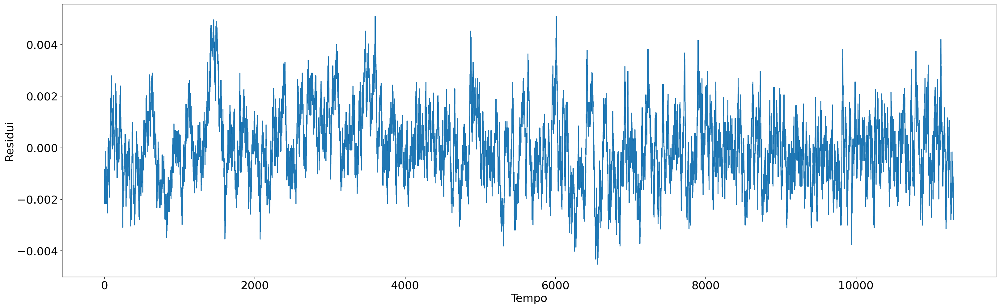

In [36]:
plt.figure(figsize =(30,9),dpi = 130)

plt.xlabel("Tempo", fontsize = 20)
plt.ylabel("Residui", fontsize = 20)
plt.plot(time, residuals)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)


(array([-0.006, -0.004, -0.002,  0.   ,  0.002,  0.004,  0.006]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

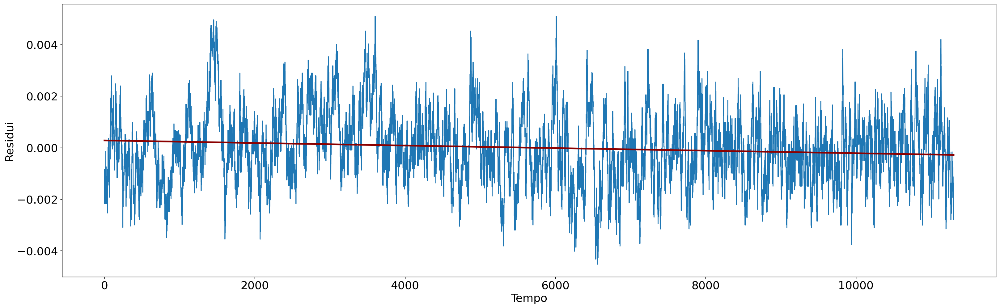

In [37]:
plt.figure(figsize =(30,9),dpi = 130)
time = [i*0.4 for i in range(len(data["temp_corr"]))]
err = [res_st for i in range(len(data["temp_corr"]))]
retta_res = fit(time,residuals, err)
model = [retta_res[0]+f*retta_res[1] for f in time]
plt.plot(time,residuals)
plt.plot(time,model, color= "darkred", linewidth = 3)
plt.xlabel("Tempo", fontsize = 20)
plt.ylabel("Residui", fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)

In [38]:
retta_res

[0.0002786445309297415,
 -4.966666932653243e-08,
 1.665887522134955e-05,
 2.553520737848595e-09,
 27871.686973697477]

In [65]:
def resfunction(m,q):
    resu = []
    for i in range(len(data["temp_corr"])):
        r = (data["RH_true"][i]-(m*data["temp_corr"][i]+q))/data["RH_true"][i]
        resu.append(r)  

    time = [i*0.4 for i in range(len(data["temp_corr"]))]
    err = [res_st for i in range(len(data["temp_corr"]))]
    result  = fit(time,resu, err)[1]
    return result

In [67]:

fsolve(resfunction, (m,q))

TypeError: resfunction() missing 1 required positional argument: 'q'

Text(0, 0.5, 'Residui')

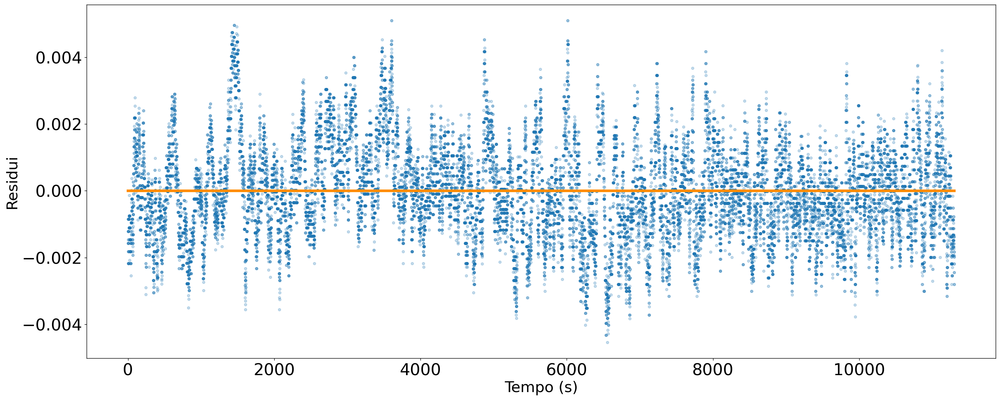

In [92]:
plt.figure(figsize =(25,10),dpi = 130)
plt.scatter(time, residuals, s= 15, alpha = 0.25, label = "residui") 
r_medio= media(residuals)
plt.plot(time, [r_medio for i in time], color = "darkorange", linewidth = 4)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.xlabel("Tempo (s)", fontsize = 23)
plt.ylabel("Residui", fontsize = 23)

In [93]:
r_medio

-1.9622174311127293e-06

Come si può vedere r_medio è alquanto piccolo

Media a n_blocco di punti. Credo sia totalmente inutile. Procedo invece a fare 


In [56]:
"""n_blocco = 1000
plt.figure(figsize =(25,10),dpi = 130)
plt.scatter(time, residuals, s= 15, alpha = 0.25, label = "residui") 
medie_blocchi = []

plt.plot([time[i] for i in range(n_blocco,len(time),n_blocco)], , color = "darkorange", linewidth = 4)
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.xlabel("Tempo (s)", fontsize = 23)
plt.ylabel("Residui", fontsize = 23)"""

'n_blocco = 1000\nplt.figure(figsize =(25,10),dpi = 130)\nplt.scatter(time, residuals, s= 15, alpha = 0.25, label = "residui") \nmedie_blocchi = []\n\nplt.plot([time[i] for i in range(n_blocco,len(time),n_blocco)], , color = "darkorange", linewidth = 4)\nplt.xticks(fontsize = 25)\nplt.yticks(fontsize = 25)\nplt.xlabel("Tempo (s)", fontsize = 23)\nplt.ylabel("Residui", fontsize = 23)'

Si può calcolare ora la correlazione tra queste due grandezze


In [7]:
Pearson = data["temp_corr"].corr( data["RH_true"])
print(Pearson)

-0.8791900914556947


 Il risultato è negativo, come atteso, ed è a elevato. Si può calcolare l'errore sulla correlazione grazie alla formula $\sigma_\rho = \sqrt{\frac{1- \rho^2}{n-2}} $


In [8]:
n = len(data["temp_corr"])
delta_rho = np.sqrt((1-Pearson**2)/(n-2))
print(delta_rho)

0.00283488271141384


Insomma $\rho = -0.879 \pm 0.003$ per tutto il dataset.

Text(0, 0.5, 'Umidità (%)')

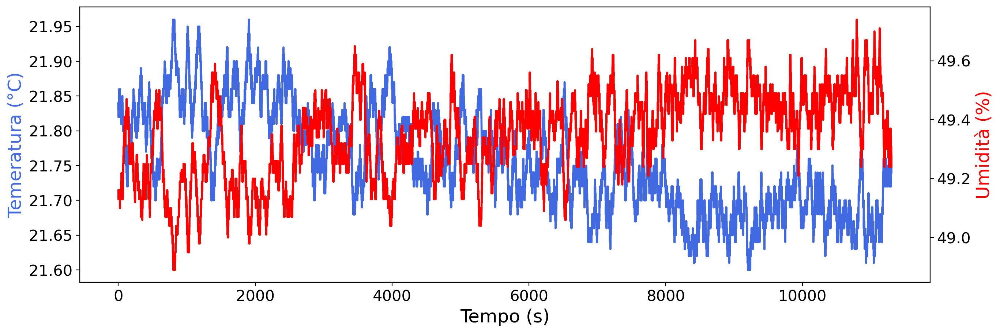

In [9]:

fig,ax = plt.subplots(figsize=(15, 5), dpi= 200)
ax.set_ylabel("Temeratura (°C)", color = "royalblue", fontsize= 18)
ax.plot(time, data["temp_corr"] , color = "royalblue", linewidth = 2 )
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)

ax2 = ax.twinx()
ax2.plot(time, data["RH_true"] , color = "red",label ="Umidità (%)", linewidth = 2  )
ax.set_xlabel("Tempo (s)", fontsize= 18)
plt.yticks(fontsize= 15)
ax2.set_ylabel("Umidità (%)",color = "red", fontsize= 18)


Text(0, 0.5, 'Temeratura (°C)')

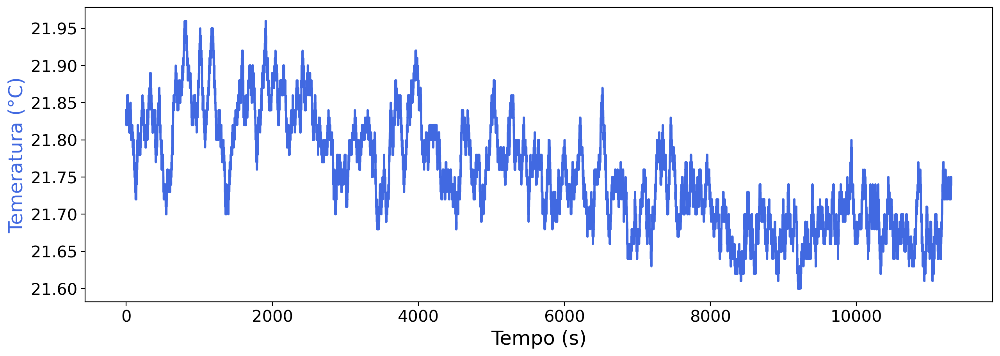

In [10]:
plt.figure(figsize=(15, 5), dpi= 200)
plt.plot(time, data["temp_corr"] , color = "royalblue", linewidth = 2 )
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)
plt.xlabel("Tempo (s)", fontsize= 18)
plt.ylabel("Temeratura (°C)", color = "royalblue", fontsize= 18)

Text(0, 0.5, 'Umidità (%)')

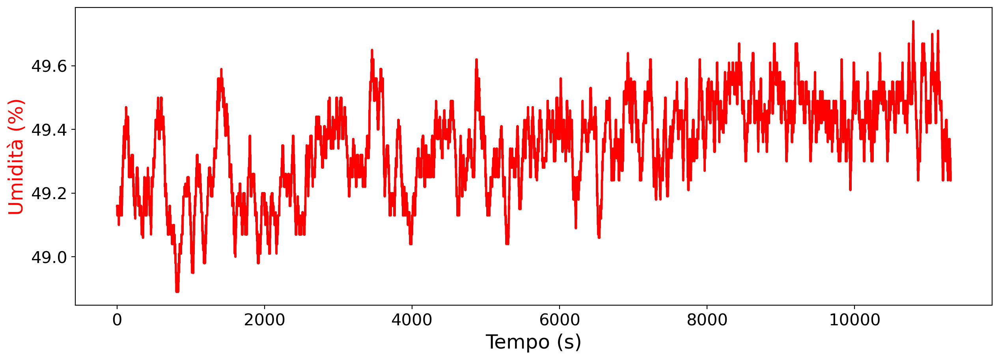

In [11]:
plt.figure(figsize=(15, 5), dpi= 200)
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)
plt.plot(time, data["RH_true"] , color = "red",label ="Umidità (%)", linewidth = 2  )
plt.xlabel("Tempo (s)", fontsize= 18)
plt.ylabel("Umidità (%)",color = "red", fontsize= 18)

Il tempo a metà acquisizione è di circa 5650 secondi. Vediamo di dividere il precedente plot in due più piccoli

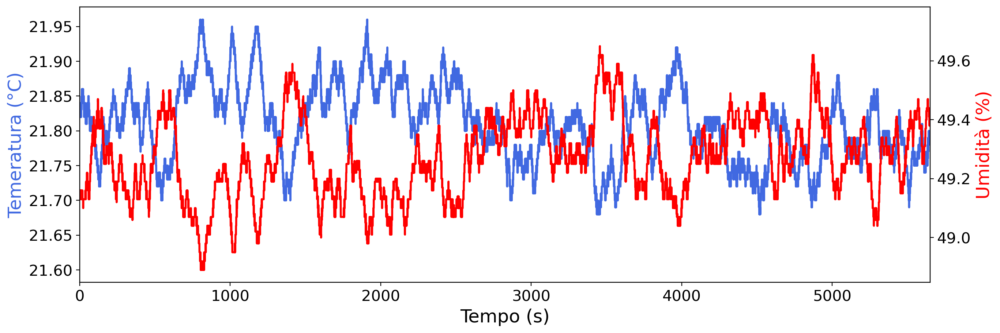

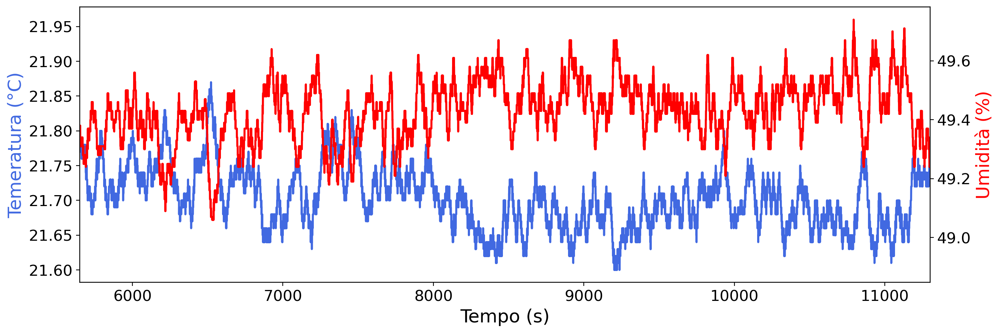

In [12]:
time = [i*0.4 for i in range(len(data["temp_corr"]))]
fig,ax = plt.subplots(figsize=(15, 5), dpi= 200)
ax.set_ylabel("Temeratura (°C)", color = "royalblue", fontsize= 18)
ax.plot(time, data["temp_corr"] , color = "royalblue", linewidth = 2 )
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)

ax2 = ax.twinx()
ax2.plot(time, data["RH_true"] , color = "red",label ="Umidità (%)", linewidth = 2  )
ax.set_xlabel("Tempo (s)", fontsize= 18)
plt.yticks(fontsize= 15)
ax2.set_ylabel("Umidità (%)",color = "red", fontsize= 18)
plt.xlim(0,5650)
plt.show()
time = [i*0.4 for i in range(len(data["temp_corr"]))]
fig,ax = plt.subplots(figsize=(15, 5), dpi= 200)
ax.set_ylabel("Temeratura (°C)", color = "royalblue", fontsize= 18)
ax.plot(time, data["temp_corr"] , color = "royalblue", linewidth = 2 )
plt.xticks(fontsize= 15)
plt.yticks(fontsize= 15)

ax2 = ax.twinx()
ax2.plot(time, data["RH_true"] , color = "red",label ="Umidità (%)", linewidth = 2  )
ax.set_xlabel("Tempo (s)", fontsize= 18)
plt.yticks(fontsize= 15)
ax2.set_ylabel("Umidità (%)",color = "red", fontsize= 18)
plt.xlim(5650,11301)
plt.show()

In questi due grafici si evidenzia un'anticorrelazione tra i due fenomeni, come ci si aspettava. Dividere in due il tempo aiuta a visualizzare meglio questa relazione. Possiamo ora graficare in funzione del tempo queste due grandezze


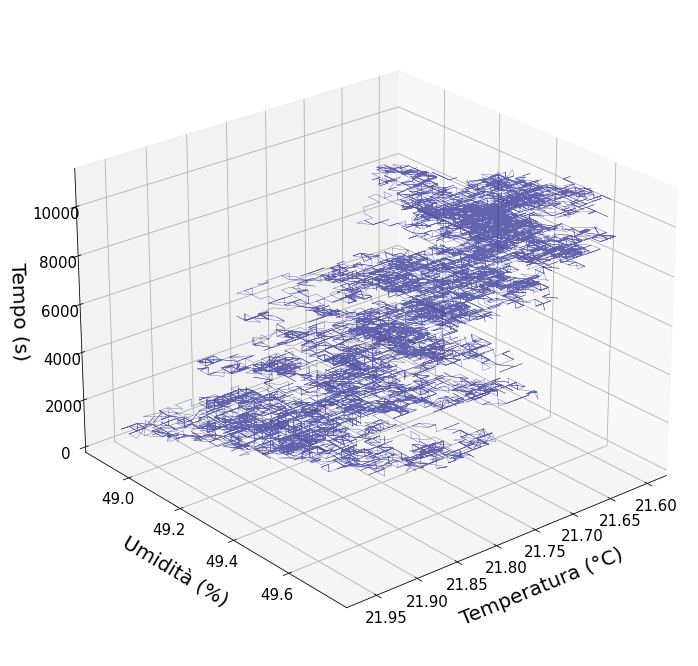

In [13]:
fig = plt.figure(figsize = (13,12))
ax = plt.axes(projection = '3d')

ax.plot3D(data["temp_corr"] , data["RH_true"] ,time,  alpha = 0.6, color = "navy", markersize  =0.5, linewidth = 0.4)
ax.view_init(25, 50)
ax.set_xlabel("Temperatura (°C)", fontsize = 20,labelpad = 15)
ax.set_ylabel("Umidità (%)" ,fontsize = 20,labelpad = 15)
ax.set_zlabel("Tempo (s)", fontsize = 20,labelpad = 15)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.yticks(fontsize = 15)
ax.zaxis.set_tick_params(labelsize=15)


Se devo dividere in 10 sottocampioni una presa dati di un po' più di 11000 dati, posso fare sì che questi siano di 1100. Qui manca la stima dell'errore sulla correlazione. Bisogna poi provare a fare il fit lineare su questi grafichetti




In [14]:
def error_corr(rho,n):
    return  np.sqrt((1-rho**2)/(n-2))
def retta(a,b,x):
    return a*x+b 


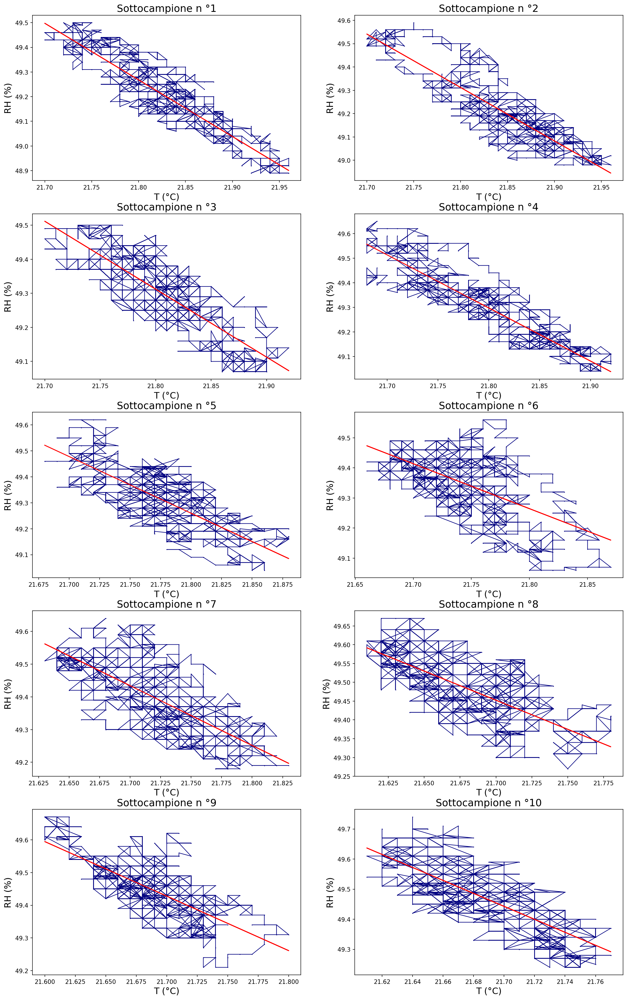

In [50]:
fig, axs = plt.subplots(5,2, figsize = (18,30), dpi = 150)
correlations_10 = []
correlations_errors_10= []
n_data_10 = 2825
fits_10 = []
dataframe_10 = pd.DataFrame()
for q in range (10):
    j = q%2
    i = q//2
    
    step = q*n_data_10
    step_1 = step + n_data_10
    locx ,locy = list(data["temp_corr"][step:step_1]) , list(data["RH_true"][step:step_1])
    localdic = {"x_"+str(q): locx, "y_"+str(q): locy}
    axs[i,j].plot(locx ,locy , "-o", color = "navy", markersize  =0.5, linewidth = 1)
    axs[i,j].set_title("Sottocampione n °" + str(q+1), fontsize = 17)
    axs[i,j].set_ylabel("RH (%)", fontsize = 15)
    axs[i,j].set_xlabel("T (°C)", fontsize = 15)
    
    localdf= pd.DataFrame(localdic)
    params = fit(locx ,locy, 0.01)
    fits_10.append(params)
    y_retta = [retta(params[1], params[0], i ) for i in locx]
    axs[i,j].plot(locx, y_retta, color = "red")
    #print(localdf)
    #print(dataframe_10)
    P = localdf["x_"+str(q)].corr(localdf["y_"+str(q)])
    correlations_10.append(P)
    correlations_errors_10.append(error_corr(P, n_data_10))
    
    dataframe_10["x_"+str(q)], dataframe_10["y_"+str(q)] = localdf["x_"+str(q)],localdf["y_"+str(q)]
    #print(dataframe_10)

Ricorda che per la funzione che hai scritto la retta ha equazione $y= a + bx$

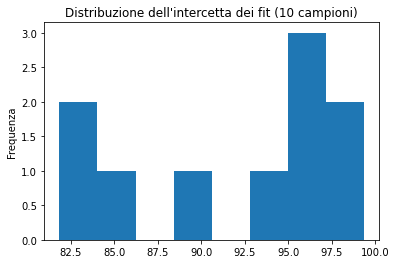

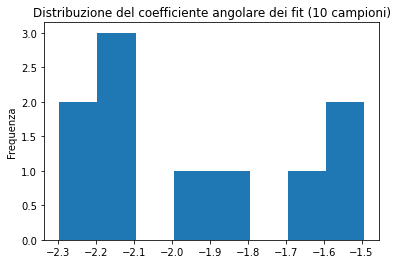

(array([3., 3., 0., 0., 2., 1., 0., 1.]),
 array([27.62867953, 32.15358763, 36.67849574, 41.20340385, 45.72831195,
        50.25322006, 54.77812817, 59.30303627, 63.82794438]),
 <BarContainer object of 8 artists>)

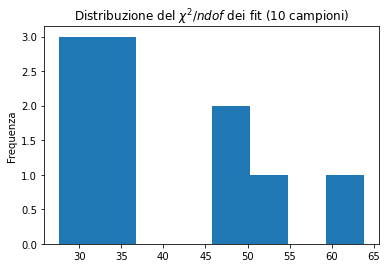

In [52]:
a_10 = [i[0] for i in fits_10]
plt.title("Distribuzione dell'intercetta dei fit (10 campioni)")
plt.ylabel("Frequenza")
plt.hist(a_10, bins = 8)
plt.show()
plt.title("Distribuzione del coefficiente angolare dei fit (10 campioni)")
plt.ylabel("Frequenza")
b_10 = [i[1] for i in fits_10]
plt.hist(b_10, bins = 8)
plt.show()
plt.title("Distribuzione del $\chi^2/ndof$ dei fit (10 campioni)")
plt.ylabel("Frequenza")
chi2_10 =  [i[4]/(n_data_10-4) for i in fits_10]
plt.hist(chi2_10, bins = 8)

(array([0.63079646, 1.64389381, 1.74584071, 3.54265487, 3.79115044,
        3.91221239, 1.84141593, 0.75823009, 0.13380531]),
 array([49.24      , 49.29555556, 49.35111111, 49.40666667, 49.46222222,
        49.51777778, 49.57333333, 49.62888889, 49.68444444, 49.74      ]),
 <BarContainer object of 9 artists>)

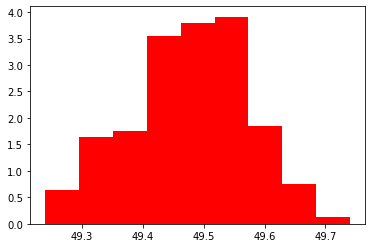

In [23]:
plt.hist(dataframe_10["y_9"], bins = 9, color = "red", density= True)

(array([0.63079646, 1.64389381, 1.74584071, 3.54265487, 3.79115044,
        3.91221239, 1.84141593, 0.75823009, 0.13380531]),
 array([49.24      , 49.29555556, 49.35111111, 49.40666667, 49.46222222,
        49.51777778, 49.57333333, 49.62888889, 49.68444444, 49.74      ]),
 <BarContainer object of 9 artists>)

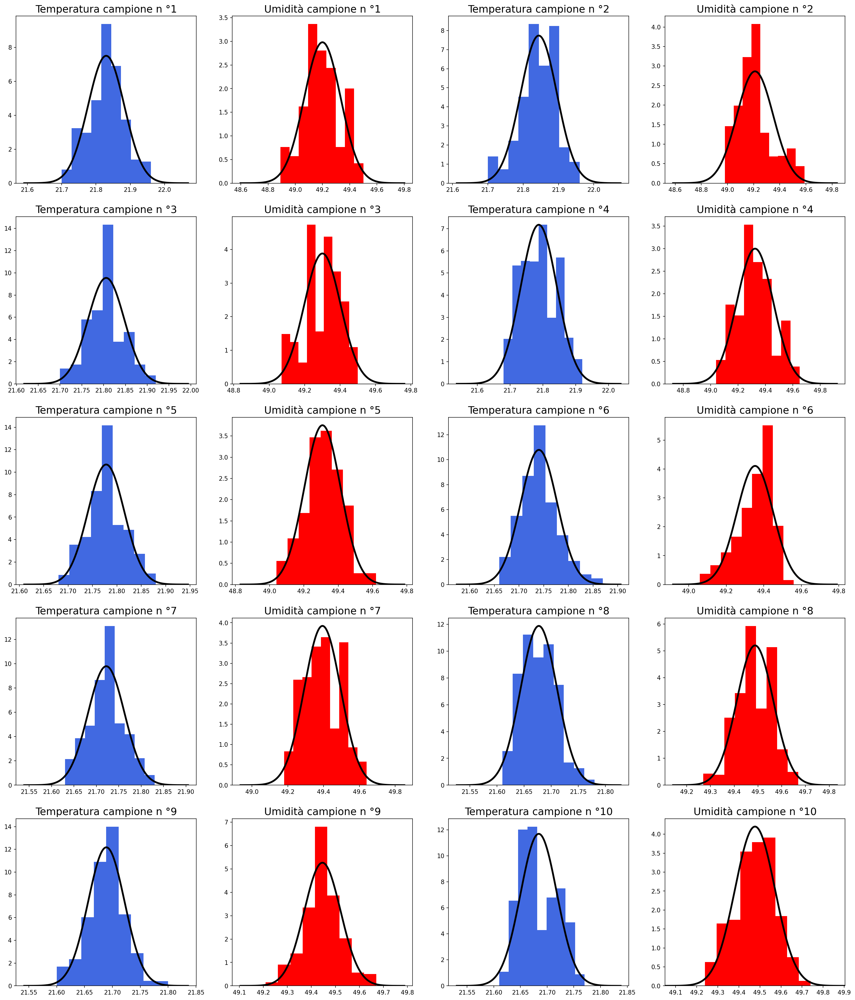

In [53]:
figg, axxsh = plt.subplots(nrows = 5,ncols=4, figsize = (25,30), dpi = 150)

for q in range (20):
    j = q%4
    i = q//4
    half = q//2
    
        
    if j== 0 or j==2:
        column= "x_"+str(half)
        axxsh[i,j].hist(dataframe_10[column], bins = 9, color = "royalblue", density = True)
        axxsh[i,j].set_title("Temperatura campione n °" + str(half+1), fontsize = 17)
        g = gaussiana (dataframe_10[column])
        axxsh[i,j].plot(g[0], g[1], color = "black", linewidth = 3)

    else:
        
        column= "y_"+str(half)
        axxsh[i,j].set_title("Umidità campione n °" + str(half+1), fontsize = 17)
        axxsh[i,j].hist(dataframe_10[column], bins = 9, color = "red", density= True)
       
            
        
        g = gaussiana (dataframe_10[column])

        axxsh[i,j].plot(g[0], g[1], color = "black", linewidth = 3)

axxsh[4,3].set_title("Umidità campione n °" + str(10), fontsize = 17)        
axxsh[4,3].hist(dataframe_10["y_9"], bins = 9, color = "red", density= True)
#g = gaussiana (dataframe_10["y_9"])

#axxsh[4,3].plot(g[0], g[1], color = "black", linewidth = 3)
  

Attenzione: i fit sono stati fatti supponendo un errore sulle y (temperatura) pari a 0.01 gradi



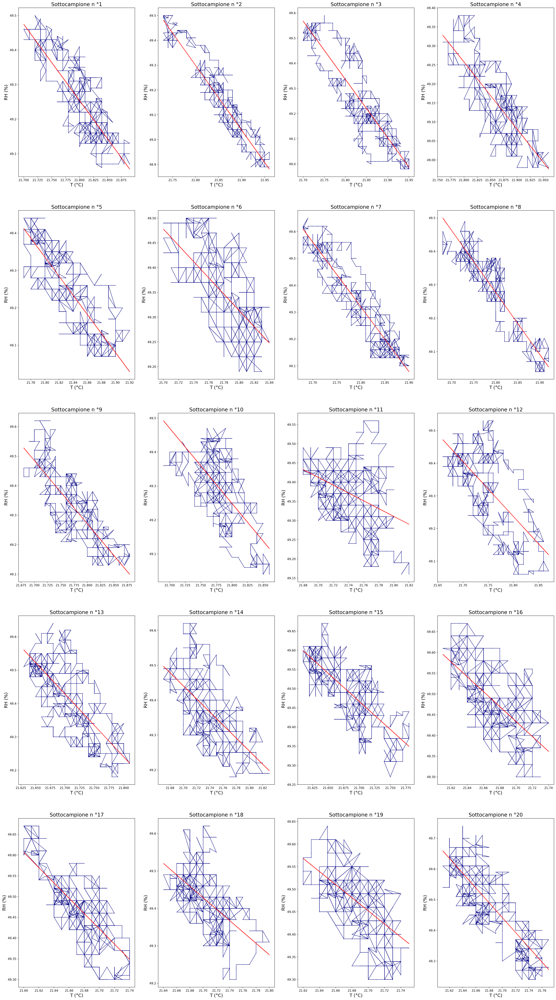

In [63]:
fig, axs = plt.subplots(5,4, figsize = (32,60), dpi = 150)
correlations_20 = []
correlations_errors_20 = []
n_data_20 = 1412
fits_20 = []
dataframe_20 = pd.DataFrame()

for q in range (20):
    j = q%4
    i = q//4
    
    step = q*n_data
    step_1 = step + n_data
    locx ,locy = list(data["temp_corr"][step:step_1]) , list(data["RH_true"][step:step_1])
    localdic = {"x_"+str(q): locx, "y_"+str(q): locy}
    axs[i,j].plot(locx ,locy , "-o", color = "navy", markersize  =0.5, linewidth = 1)
    axs[i,j].set_title("Sottocampione n °" + str(q+1), fontsize = 17)
    axs[i,j].set_ylabel("RH (%)", fontsize = 15)
    axs[i,j].set_xlabel("T (°C)", fontsize = 15)
    localdf= pd.DataFrame(localdic)
    params = fit(locx ,locy, 0.01)
    y_retta = [retta(params[1], params[0], i ) for i in locx]
    axs[i,j].plot(locx, y_retta, color = "red")
    P = localdf["x_"+str(q)].corr(localdf["y_"+str(q)])
    correlations_20.append(P)
    correlations_errors_20.append(error_corr(P, n_data))
    dataframe_20["x_"+str(q)], dataframe_20["y_"+str(q)] = localdf["x_"+str(q)],localdf["y_"+str(q)]
    fits_20.append(params)
    

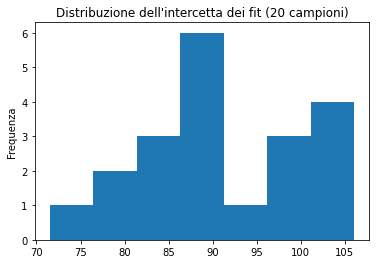

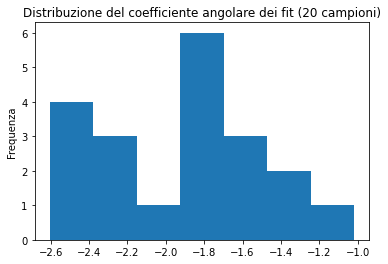

(array([3., 7., 3., 4., 1., 0., 2.]),
 array([17.61821055, 25.60640807, 33.59460558, 41.5828031 , 49.57100061,
        57.55919813, 65.54739564, 73.53559316]),
 <BarContainer object of 7 artists>)

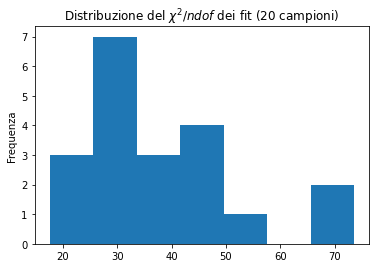

In [60]:
a_20 = [i[0] for i in fits_20]
plt.title("Distribuzione dell'intercetta dei fit (20 campioni)")
plt.ylabel("Frequenza")
plt.hist(a_20, bins = 7)
plt.show()
plt.title("Distribuzione del coefficiente angolare dei fit (20 campioni)")
plt.ylabel("Frequenza")
b_20 = [i[1] for i in fits_20]
plt.hist(b_20, bins = 7)
plt.show()
plt.title("Distribuzione del $\chi^2/ndof$ dei fit (20 campioni)")
plt.ylabel("Frequenza")
chi2_20 =  [i[4]/(n_data_20-4) for i in fits_20]
plt.hist(chi2_20, bins = 7)

**da fare**: distribuzione degli a dei b, mettere guassiane giù e migliorare il binning e le etichette

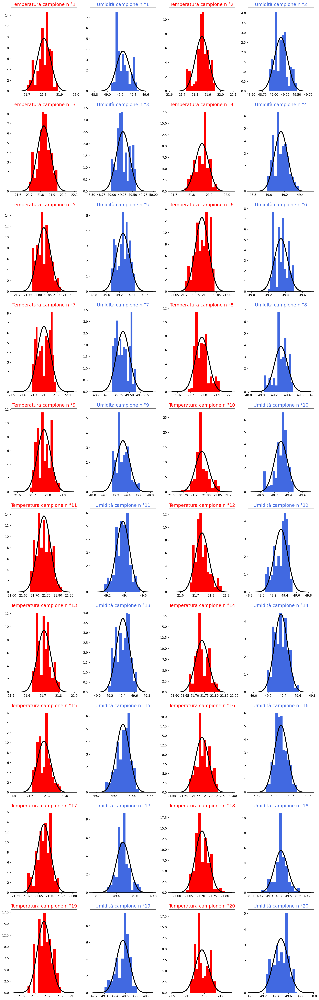

In [62]:
fig, axsh = plt.subplots(10,4, figsize = (18,60), dpi = 150)

for q in range (40):
    j = q%4
    i = q//4
    half = q//2
    if j== 0 or j==2:
        column= "x_"+str(half)
        axsh[i,j].hist(dataframe_20[column], bins = 13,color = "red", density = True)
        axsh[i,j].set_title("Temperatura campione n °" + str(half+1), fontsize = 15, color = "red")
        g = gaussiana (dataframe_20[column])
        axsh[i,j].plot(g[0], g[1], color = "black", linewidth = 3)

    else:
        column= "y_"+str(half)
        axsh[i,j].hist(dataframe_20[column], bins = 13,color = "royalblue", density = True)
        axsh[i,j].set_title("Umidità campione n °" + str(half+1), fontsize = 15, color = "royalblue")
        g = gaussiana (dataframe_20[column])
        axsh[i,j].plot(g[0], g[1], color = "black", linewidth = 3)


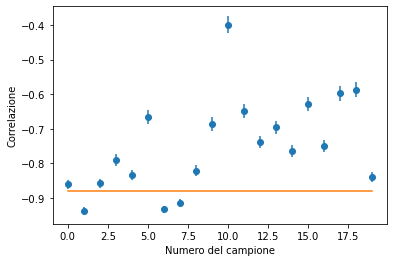

In [21]:
plt.ylabel("Correlazione")
plt.xlabel("Numero del campione")
interval = [i for i in range(len(correlations_20))]
plt.scatter(interval,correlations_20, marker = "o")
plt.errorbar(interval,correlations_20, yerr = correlations_errors_20, ls = "none")
plt.plot(interval, [Pearson for i in range(len(correlations_errors_20))])


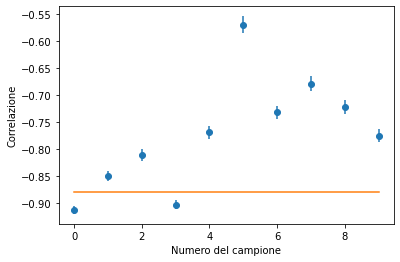

In [28]:
plt.ylabel("Correlazione")
plt.xlabel("Numero del campione")
interval = [i for i in range(len(correlations_10))]
plt.scatter(interval,correlations_10, marker = "o")
plt.errorbar(interval,correlations_10, yerr = correlations_errors_10, ls = "none")
plt.plot(interval, [Pearson for i in range(len(correlations_errors_10))])


(array([2., 1., 1., 1., 1., 2., 1., 0., 0., 1.]),
 array([-0.91175905, -0.87749725, -0.84323544, -0.80897364, -0.77471184,
        -0.74045004, -0.70618823, -0.67192643, -0.63766463, -0.60340282,
        -0.56914102]),
 <BarContainer object of 10 artists>)

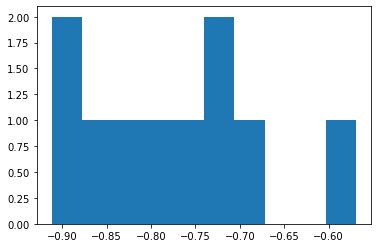

In [29]:
plt.hist(correlations_10)

In [ ]:

media_u= np.mean(data["RH_true"] )
sigma_u =np.std(data["RH_true"] )
x = np.arange(media_u-sigma_u*4.5, media_u+sigma_u*4.5, 0.001)
y = [stats.norm.pdf(i,media_u, sigma_u) for i in x]
b = plt.hist(data["RH_true"] , density = True, bins= 20) 
plt.plot(x,y, color = "red")
plt.xlabel("Umidità relativa (%)")
plt.xlim(media_u-sigma_u*4.5, media_u+sigma_u*4.5)
plt.show()


In [ ]:
b = plt.hist(data["temp_corr"] , density = True) 


In [ ]:
x = np.arange(22.55, 22.85, 0.001)
media_t= np.mean(data["temp_corr"])
sigma_t =np.std(data["temp_corr"])
y = [stats.norm.pdf(i,media_t, sigma_t) for i in x]
b = plt.hist(data["temp_corr"], density = True, bins = 15) 
#a = plt.plot(x,y, color = "red")
plt.xlabel("Temperatura (°C)")

plt.show()


In [23]:
len(data["RH_true"])

28251

ValueError: autodetected range of [nan, nan] is not finite

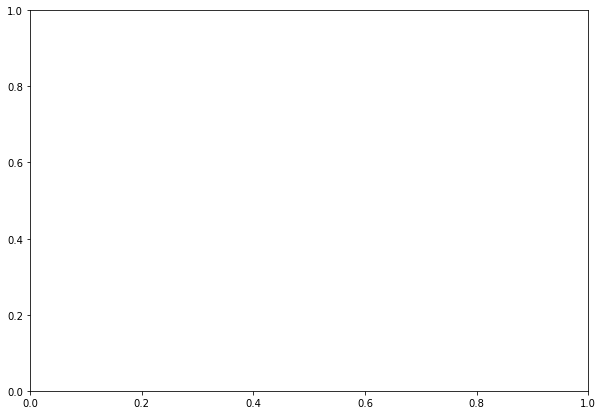

In [24]:
fig = plt.subplots(figsize =(10, 7))

heat = plt.hist2d(data["RH_true"] ,data["temp_corr"] )


In [ ]:
s = 0
correlations = []
sets = []
step = 100
for i in range(step+1,28000,step):
    a =  data["RH_true"][i-step+1:i]
    
    b = data["temp_corr"][i-step+1:i]
    corr = np.corrcoef(a,b)
    s +=1
    sets.append(s)
    
    correlations.append(corr[0,1])

In [ ]:
plt.plot(sets,correlations)

In [ ]:
count = 0
for i in range(len(data["RH_true"])):
    if data["RH_true"][i]<57.5:
        count+=1
        print(i)
print(count)      

In [ ]:
plt.figure(figsize =(7,5),dpi = 100)
plt.scatter(data["hum_corrected"][0:200], data["temp_corr"][0:200], alpha = 0.6, s=6)

In [15]:
data["hum_corrected"][200:400].corr(data["temp_corr"][200:400])

-0.39296413356931253

In [25]:
data["hum_corrected"][1:200].corr(data["temp_corr"][1:200])

-0.8380692341678544